<a href="https://colab.research.google.com/github/SammyGbabs/FaunaPulse-Capstone-Project/blob/main/Data_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Data Visualizations and Preprocessing of the Soil Fauna Activity Recordings**

In [2]:
#Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
#Installing Necessary Libraries and Packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from pathlib import Path
import librosa
import librosa.display
import IPython.display as ipd
from IPython.display import Audio
import os

In [4]:
#Getting the High and low activity audio file
folder_path = "/content/drive/MyDrive/Freq_shifted/dataset/high_activity/"
high_activity = list(Path(folder_path).glob("*.wav"))
high_activity

[PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-240_300.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-0_60.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-300_360.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-480_540.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-120_180.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-1020_1080.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-660_720.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_activity/B260T1_Clean_Left_221126-122401-840_900.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/high_acti

In [5]:
#Getting the High and low activity audio file
folder_path = "/content/drive/MyDrive/Freq_shifted/dataset/low_activity/"
low_activity = list(Path(folder_path).glob("*.wav"))
low_activity

[PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-480_540.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-180_240.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-240_300.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-360_420.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-1080_1140.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-960_1020.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-660_720.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_activity/B260T1_Clean_Right_221126-122401-780_840.wav'),
 PosixPath('/content/drive/MyDrive/Freq_shifted/dataset/low_a

In [6]:
#Playing the high activity audio file
ipd.Audio(high_activity[1])

In [7]:
#Playing the low activity audio file
ipd.Audio(high_activity[1])

In [8]:
# Loading the raw audio files
yhigh_raw, sr = librosa.load(high_activity[1])
print(yhigh_raw)
print(sr)

[-3.7880673e-05  1.9485960e-05 -6.4034481e-05 ...  1.0911287e-03
  9.5068605e-04  1.0650114e-03]
22050


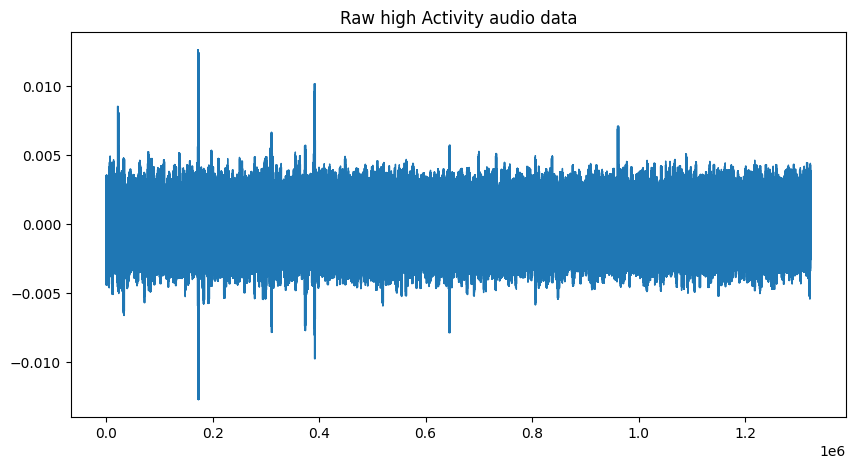

In [9]:
# Plotting the raw high activity audio data
color_pal = sns.color_palette()
pd.Series(yhigh_raw).plot(figsize=(10,5), lw=1, title="Raw high Activity audio data", color=color_pal[0])
plt.show()
plt.close()

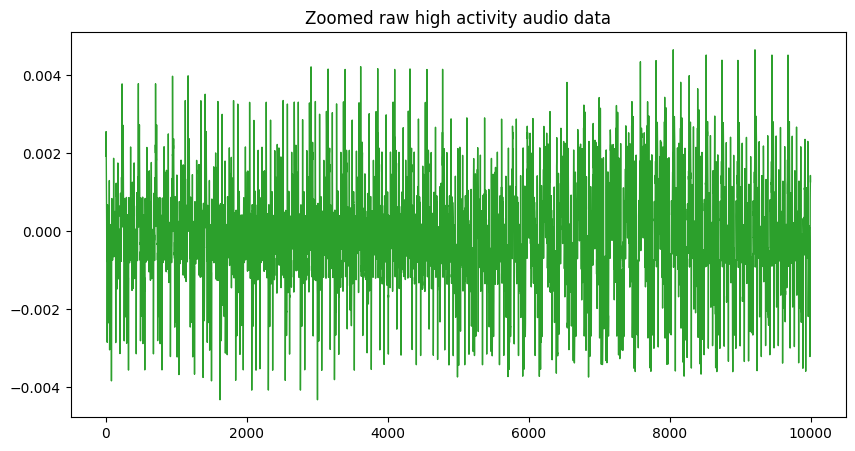

In [10]:
# Plotting the zoomed in raw healthy audio data
pd.Series(yhigh_raw[100000:110000]).plot(figsize=(10, 5), lw=1, title="Zoomed raw high activity audio data", color=color_pal[2])
plt.show()
plt.close()

In [11]:
# To load the raw audio files
ylow_raw, sr = librosa.load(low_activity[1])
print(ylow_raw)
print(sr)

[-4.2081258e-05 -1.5980564e-04 -2.6844261e-04 ...  6.1342446e-04
  3.4910211e-04  7.3092862e-04]
22050


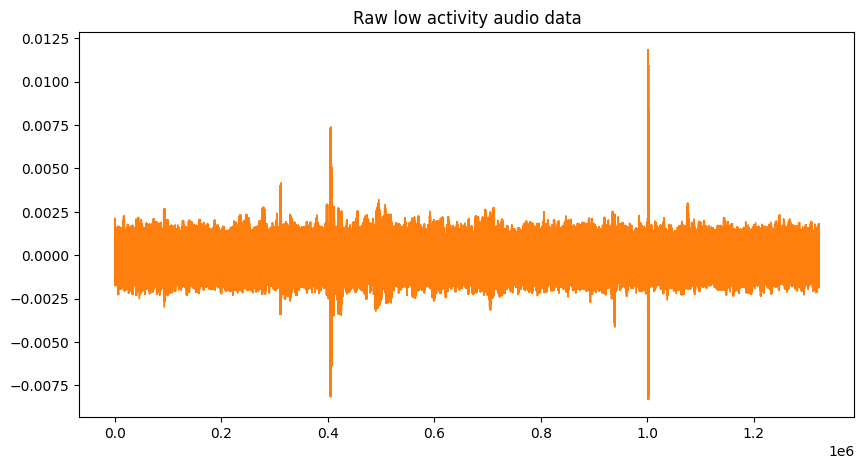

In [12]:
# Plotting the raw unhealthy audio data
pd.Series(ylow_raw).plot(figsize=(10,5), lw=1, title="Raw low activity audio data", color=color_pal[1])
plt.show()
plt.close()

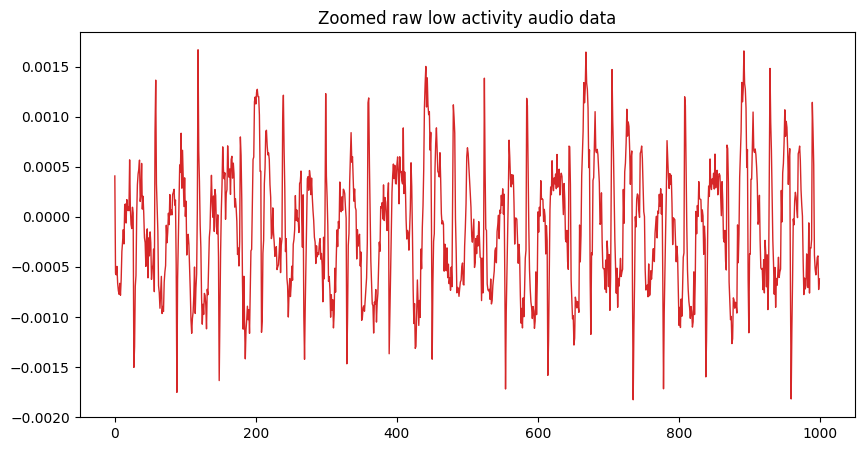

In [13]:
# Plotting the zoomed in raw unhealthy audio data
pd.Series(ylow_raw[5000:6000]).plot(figsize=(10, 5), lw=1, title="Zoomed raw low activity audio data", color=color_pal[3])
plt.show()
plt.close()

In [14]:
# Transform the yhigh_raw to spectogram
stft = librosa.stft(yhigh_raw)
stft_db = librosa.amplitude_to_db(abs(stft), ref=np.max)
stft_db.shape

(1025, 2584)

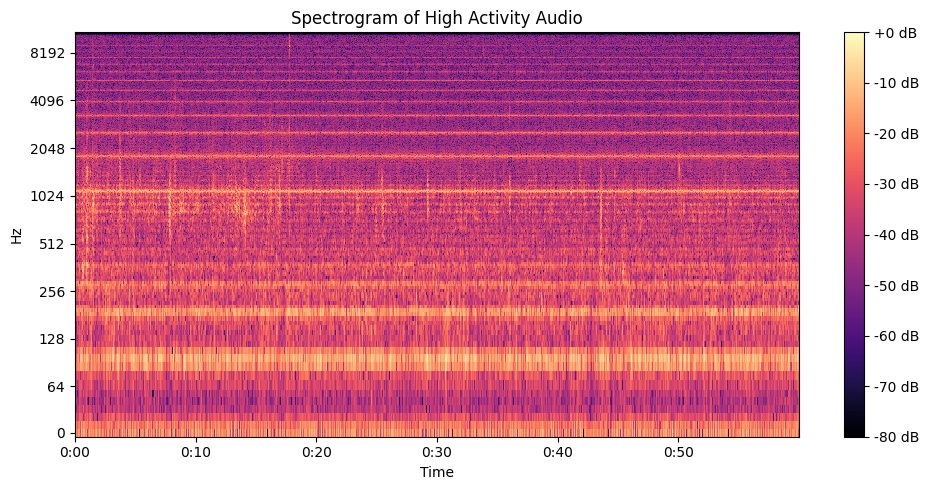

In [15]:
# Plot a spectogram of the raw high activity audio data
plt.figure(figsize=(10, 5))
librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of High Activity Audio')
plt.tight_layout()
plt.show()
plt.close()

In [16]:
# Transform the yhigh_raw to mel spectogram
mel_spectrogram = librosa.feature.melspectrogram(y=yhigh_raw, sr=sr)
mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)
mel_spectrogram_db.shape

(128, 2584)

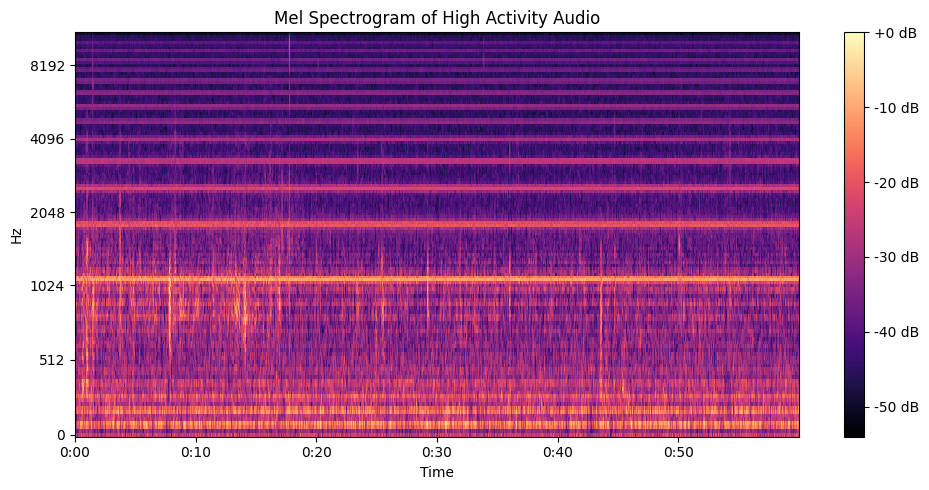

In [17]:
# Plot a mel spectogram of the raw high activity audio data
plt.figure(figsize=(10, 5))
librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram of High Activity Audio')
plt.tight_layout()
plt.show()
plt.close()

In [18]:
# Transform the yhigh_raw to spectogram
stft_low = librosa.stft(ylow_raw)
stft_low_db = librosa.amplitude_to_db(abs(stft_low), ref=np.max)
stft_low_db.shape

(1025, 2584)

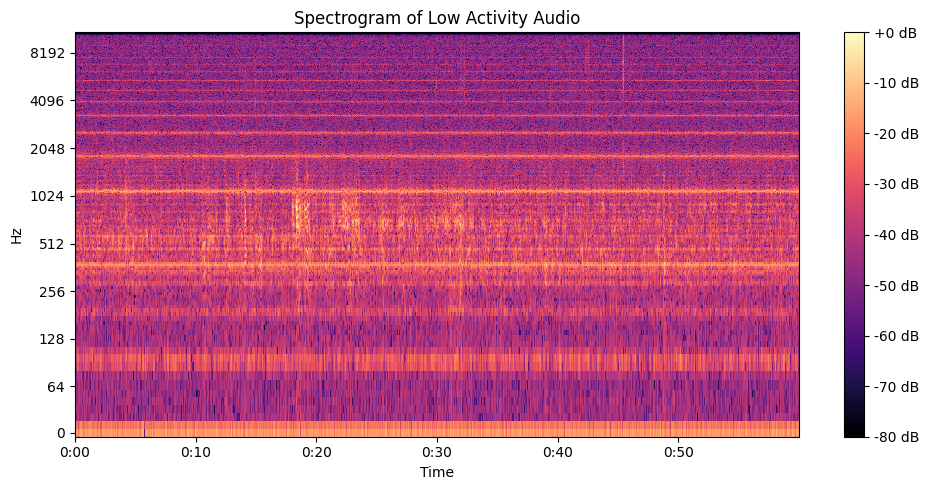

In [19]:
# Plot a spectogram of the raw high activity audio data
plt.figure(figsize=(10, 5))
librosa.display.specshow(stft_low_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Low Activity Audio')
plt.tight_layout()
plt.show()
plt.close()

In [20]:
# Transform the ylow_raw to mel spectogram
mel_spectrogram_low = librosa.feature.melspectrogram(y=ylow_raw, sr=sr)
mel_spectrogram_low_db = librosa.power_to_db(mel_spectrogram_low, ref=np.max)
mel_spectrogram_low_db.shape

(128, 2584)

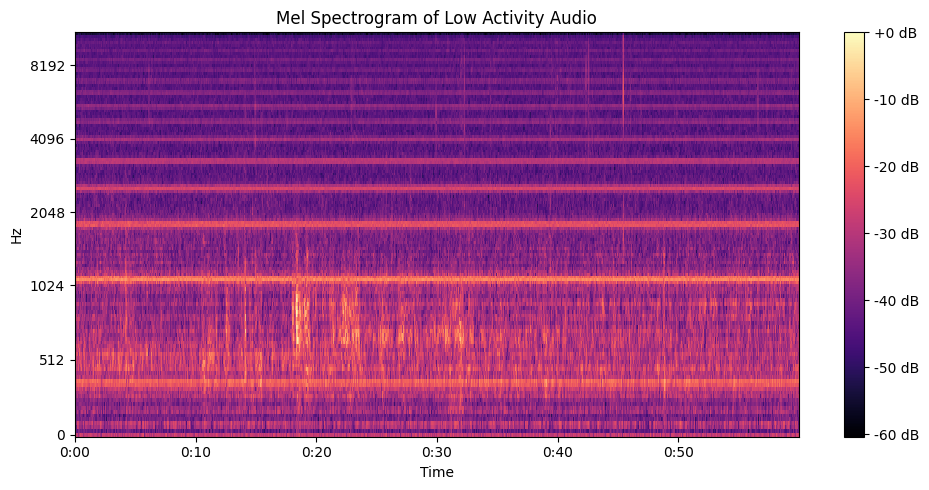

In [21]:
# Plot a mel spectogram of the raw low activity audio data
plt.figure(figsize=(10, 5))
librosa.display.specshow(mel_spectrogram_low_db, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram of Low Activity Audio')
plt.tight_layout()
plt.show()
plt.close()

In [ ]:
# Function to generate and save mel spectrograms
def generate_and_save_mel_spectrogram(audio_files, output_dir, activity_type):
    for idx, audio_file in enumerate(audio_files):
        try:
            # Load the audio file
            y, sr = librosa.load(audio_file)

            # Generate mel spectrogram
            mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
            mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)

            # Plot and save the mel spectrogram
            plt.figure(figsize=(10, 5))
            librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
            plt.colorbar(format='%+2.0f dB')
            plt.title(f'Mel Spectrogram of {activity_type.capitalize()} Activity Audio')
            plt.tight_layout()

            # Define the output filename
            filename = f"{activity_type}_{idx}.png"
            filepath = os.path.join(output_dir, filename)

            # Save the plot
            plt.savefig(filepath)
            plt.close()

        except Exception as e:
            print(f"Error processing {audio_file}: {e}")

# Function to batch process audio files
def batch_process_audio(audio_files, output_dir, activity_type, batch_size=10):
    num_files = len(audio_files)
    for i in range(0, num_files, batch_size):
        batch_files = audio_files[i:i + batch_size]
        print(f"Processing batch {math.ceil((i + 1) / batch_size)} of {math.ceil(num_files / batch_size)} for {activity_type}")
        generate_and_save_mel_spectrogram(batch_files, output_dir, activity_type)
        # Optional: Add a small delay to further prevent memory issues
        # import time
        # time.sleep(1)

# Define the base directory for saving mel spectrograms
mel_data_dir = "/content/drive/MyDrive/Freq_shifted/dataset/mel_data"
high_activity_mel_dir = os.path.join(mel_data_dir, "high_activity")
low_activity_mel_dir = os.path.join(mel_data_dir, "low_activity")

# Create directories if they don't exist
os.makedirs(high_activity_mel_dir, exist_ok=True)
os.makedirs(low_activity_mel_dir, exist_ok=True)

# Process and save mel spectrograms in batches
batch_process_audio(high_activity, high_activity_mel_dir, "high_activity", batch_size=20)
batch_process_audio(low_activity, low_activity_mel_dir, "low_activity", batch_size=20)

print("Mel spectrogram images and labels saved successfully!")


Processing batch 1 of 9 for high_activity
Processing batch 2 of 9 for high_activity
Processing batch 3 of 9 for high_activity
Processing batch 4 of 9 for high_activity
Processing batch 5 of 9 for high_activity
Processing batch 6 of 9 for high_activity
Processing batch 7 of 9 for high_activity
Processing batch 8 of 9 for high_activity
Processing batch 9 of 9 for high_activity
Processing batch 1 of 22 for low_activity
Processing batch 2 of 22 for low_activity
Processing batch 3 of 22 for low_activity
Processing batch 4 of 22 for low_activity
Processing batch 5 of 22 for low_activity
Processing batch 6 of 22 for low_activity
Processing batch 7 of 22 for low_activity
Processing batch 8 of 22 for low_activity
Processing batch 9 of 22 for low_activity
Processing batch 10 of 22 for low_activity
Processing batch 11 of 22 for low_activity
Processing batch 12 of 22 for low_activity
Processing batch 13 of 22 for low_activity
Processing batch 14 of 22 for low_activity
Processing batch 15 of 22 for